In [1]:
import time
import copy
from IPython.display import Markdown, display, Video
from io import BytesIO
import os

import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MultipleLocator, FormatStrFormatter
import imageio.v2 as imageio

import tempfile

%matplotlib inline

In [2]:
def assign_data_to_centroids(X, centroids):
    """
    Assigns data X to centroids.
    """
    num_centroids = centroids.shape[0]

    ## compute distance to centroids
    dist = np.sum((X[:,np.newaxis] - centroids)**2,axis=-1)

    ## assign the centroid with lowest distance
    centroids_assigned = np.argmin(dist, axis = -1)

    ## separate data X by assigned centroid
    X_assigned = {}

    for _c in range(num_centroids):
        _x_assign = X[centroids_assigned == _c]
        X_assigned[_c] = _x_assign

    return centroids_assigned, X_assigned

def kmeans_loss_function(X, centroids, X_assigned):
        
    num_centroids = centroids.shape[0]

    loss = 0.0
    for _c in range(num_centroids):
        loss += np.sum((centroids[_c] - X_assigned[_c])**2)

    return loss

class Kmeans:
    def __init__(self, num_centroids : int, plotter = None):
        self.num_centroids = num_centroids
        
        self._run_plotter = True
        if plotter is None:
            self._run_plotter = False
            
        self._plotter = plotter
      
    @property
    def centroids(self):
        return copy.deepcopy(self._centroids)
    
    def _assign_data_to_centroids(self,X, centroids = None):
        """
        Assigns data X to centroids.
        """
        
        if centroids is None:
            centroids = self._centroids
        
        ## compute distance to centroids
        dist = np.sum((X[:,np.newaxis] - centroids)**2,axis=-1)
        
        ## assign the centroid with lowest distance
        centroids_assigned = np.argmin(dist, axis = -1)
        
        ## separate data X by assigned centroid
        X_assigned = {}
        
        for _c in range(self.num_centroids):
            _x_assign = X[centroids_assigned == _c]
            X_assigned[_c] = _x_assign
        
        return centroids_assigned, X_assigned
    
    def _get_new_centroids(self,X):
        centroids_assigned, X_assigned = self._assign_data_to_centroids(X)   
                
        for _c in range(self.num_centroids):           
            _x_assign = X_assigned[_c]
            # if no data then keep old centroid
            if _x_assign.size != 0:
                self._centroids[_c] = np.mean(X_assigned[_c], axis = 0)
                
        return centroids_assigned, X_assigned
            
    def run_iter(self,X):
        return self._get_new_centroids(X)
        
    def run(self,X, num_iters, seed = None):
        
        self.initialize_centroids(X, seed = seed)
        
        for itet in range(num_iters):
            print(f"Running iteration {itet}", end = "\r")
            centroids_old = copy.deepcopy(self.centroids)
            
            centroids_assigned, X_assigned = self.run_iter(X)

            loss = self.loss_function(X, X_assigned = X_assigned)
            
            ## plot 
            if self._run_plotter:
                self._plotter.draw_cluster_assignments(centroids_old,X_assigned)
                self._plotter.draw_loss_function(centroids_old)
                self._plotter.draw_new_centroids(self._centroids)
                self._plotter.draw_loss_at_given_centroids(centroids_old, self._centroids)
                self._plotter.draw_loss(loss)
            
            print(f"Running iteration {itet} loss {loss:.3f}")

            if np.all(self.centroids == centroids_old):
                break
                
        if self._run_plotter:
            self._plotter.close_video()
                
    def initialize_centroids(self,X, seed = None):
        if seed is not None:
            np.random.seed(seed)
        
        # we start by chosing randomly from X.
        centroids_idx = np.random.randint(0, X.shape[0], size=self.num_centroids)
        
        self._centroids = X[centroids_idx]
        
        if self._run_plotter:
            self._plotter.draw_initial_centroids(self._centroids, X )
            
        return self._centroids
    
    def loss_function(self, X, centroids = None, X_assigned = None):
        
        if centroids is None:
            centroids = self.centroids
            num_centroids = self.num_centroids
        else:
            num_centroids = centroids.shape[0]
        
        if X_assigned is None:
            _, X_assigned = self._assign_data_to_centroids(X, centroids = centroids)
        
        loss = 0.0
        for _c in range(num_centroids):
            loss += np.sum((centroids[_c] - X_assigned[_c])**2)
            
        return loss
            
# todo: move to ABC
class PlotterBase:
    def show_plot(self):
        self.fig.canvas.draw()    
        self.fig.canvas.flush_events()
        time.sleep(self.sleep_time)

    def save_video_frame(self):
        buf = BytesIO()
        self.fig.savefig(buf, format="png", dpi=100)

        buf.seek(0)
        frame = imageio.imread(buf) 
        self.writer.append_data(frame)
        
    def show_video(self):
        if self.video_filename is not None:
            display(Video(data=self.video_filename, embed=True))
            os.remove(self.video_filename)
            
    def close_plot(self):
        if self.interactive_plot:
            plt.close(self.fig)
        
    def close_video(self):
        if self.video:
            self.writer.close()     
            
        if not self.interactive_plot:
            plt.close(self.fig)
                         
class Plot1DKmeans(PlotterBase):
    def __init__(self, 
                 video:bool = False, 
                 interactive_plot = False, 
                 sleep_time: float = 0.1, 
                 draw_voronoi : bool = False,
                 loss_fun_optim : bool = False,
                 num_loss_fun_centroids_to_show : int = None,
                ):
        
        self.video = video
        self.interactive_plot = interactive_plot
        self.loss_fun_optim = loss_fun_optim
        self.voronoi = draw_voronoi
        
        if self.video or self.interactive_plot:
            num_row_plot = 1
            figsize = None
            if self.loss_fun_optim:
                self.num_loss_fun_centroids_to_show = num_loss_fun_centroids_to_show
                num_row_plot = 1 + num_loss_fun_centroids_to_show
                figsize = (10,10)
                
            fig, ax = plt.subplots(num_row_plot,2, figsize = figsize )
            
            # to match data structure when num_rows > 1
            if num_row_plot == 1:
                ax = [ax]
            
            # primera fila solo un dibujo
            ax_top = fig.add_subplot(num_row_plot, 1, 1)   
            ax[0][1].remove()               
            ax[0][0].remove()
            
            axs_list = [ax_top]
            
            self.fig = fig
            if num_row_plot == 1:
                self.ax = axs_list
            else:

                for i in range(1, num_row_plot):
                    axs_list.append([ax[i, 0], ax[i, 1]])

                self.ax = axs_list
                
            self.sleep_time = sleep_time
            
            if self.voronoi:
                # to predict with kmeans
                self.predictor = assign_data_to_centroids
                xx = np.linspace(-10, 10, 500)
                self.vor_grid_xx = np.reshape( xx, (xx.shape[0],1))
                
            if self.loss_fun_optim:
                xx = np.linspace(-10, 10, 500)
                self.loss_fun_grid = np.reshape(xx, (xx.shape[0],1) )
        
        # this should be done in a separate class instance.
        self.video_filename = None
        if self.video:
            # Create temporary file for video creation
            self.video_filename = "/tmp/aux.mp4"

            ## video writer
            self.writer = imageio.get_writer(self.video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  
            
    def draw_initial_centroids(self,centroids,X):
        
        if self.interactive_plot or self.video:  
            self.ax[0].cla()
            self.ax[0].plot(X,np.zeros_like(X), 'x', color = 'k')

            for idx,cet in enumerate(centroids):
                self.ax[0].plot(cet,0.0, 'o', color = f'C{idx}')

            self.ax[0].set_title("Initial Centroids")     
            
            self.draw_voronoi(centroids)
            
            self.ax[0].legend()
            
        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()

    def draw_cluster_assignments(self, centroids,X_assigned):
        
        if self.interactive_plot or self.video:  
            num_centroids = centroids.shape[0]

            self.ax[0].cla()

            for idx,cet in enumerate(centroids):
                label = ""
                if idx == 0:
                    label = "Centroid"

                self.ax[0].plot(cet,0.0, 'o', color = f'C{idx}', label = label)

            for _c in range(num_centroids):
                _X = X_assigned[_c]

                self.ax[0].plot(_X,np.zeros_like(_X), 'x',  color = f'C{_c}')
                self.ax[0].set_title("Centroids Assignment")

            self.draw_voronoi(centroids)
            
            self.ax[0].legend()

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_loss_function(self, centroids):

        if self.loss_fun_optim:
            
            if self.interactive_plot or self.video:                 
                
                # obtain loss function of current point
                centroids_assigned_true, X_assigned_true = self.predictor(X, centroids = centroids)
                loss_true = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned_true)

                # to separate the cost function within the different assignments
                assigned_regions = {}

                # to keep loss
                loss_acc = {}
                loss_acc_convex = {}

                # to keep region colors
                region_colors = {}

                for cent2change in range(self.num_loss_fun_centroids_to_show):
                    
                    self.ax[cent2change+1][0].cla()
                    self.ax[cent2change+1][1].cla()
                    
                    ## to separate the cost function within the different assignments
                    assigned_regions[cent2change] = []

                    # to keep loss
                    loss_acc[cent2change] = []
                    loss_acc_convex[cent2change] = []
                    
                    # save centroids
                    centroids_run = copy.deepcopy(centroids)

                    # obtain loss function over grid within assignments
                    for _c in self.loss_fun_grid:
                        centroids_run[cent2change,:] = _c

                        centroids_assigned, X_assigned = self.predictor(X, centroids = centroids_run)

                        assigned_regions[cent2change].append(tuple(centroids_assigned))

                        # overlapped loss function
                        loss = kmeans_loss_function(X, centroids = centroids_run, X_assigned = X_assigned)
                        loss_acc[cent2change].append(loss)
                        
                        # convex loss function
                        loss = kmeans_loss_function(X, centroids = centroids_run, X_assigned = X_assigned_true)
                        loss_acc_convex[cent2change].append(loss)

                    unique_assignments = list(set(assigned_regions[cent2change]))
                    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
                    
                    ## ==================
                    ## Draw loss function
                    
                    # separate by colors
                    start = 0
                    for i in range(1, len(region_colors[cent2change])):
                        if region_colors[cent2change][i] != region_colors[cent2change][i-1]:
                            self.ax[cent2change+1][0].plot(self.loss_fun_grid[start:i+1], loss_acc[cent2change][start:i+1], color=region_colors[cent2change][i-1])
                            start = i
                        
                    ## Sometimes that exact cluster assignment is not available, probably because the grid is not
                    #  big enough
                    try:
                        color = f"C{unique_assignments.index(tuple(centroids_assigned_true))}"
                    except:
                        color = 'k'
                        
                    self.ax[cent2change+1][1].plot(self.loss_fun_grid, loss_acc_convex[cent2change], color = color)

                    ## ========================================================================================
                    ## Draw current part of the loss function within the location of the corresponding centroid
                    self.ax[cent2change+1][0].plot(centroids[cent2change],loss_true,'x', color = 'k', markersize = 5)
                    self.ax[cent2change+1][1].plot(centroids[cent2change],loss_true,'x', color = 'k', markersize = 5)
                    
                    self.ax[cent2change+1][0].set_xlabel(f"Centroid {cent2change}")
                    self.ax[cent2change+1][1].set_xlabel(f"Centroid {cent2change}")
                
            if self.interactive_plot:
                self.show_plot()

            if self.video:
                self.save_video_frame()
    
    def draw_loss_at_given_centroids(self, centroids, centroids_new):
        if self.loss_fun_optim:
            
            if self.interactive_plot or self.video:                 
                
                for cent2change in range(self.num_loss_fun_centroids_to_show):
                    
                    centroids_run = copy.deepcopy(centroids)
                    
                    # check the updated centroid goes into the optimal place of the loss function
                    centroids_run[cent2change] = centroids_new[cent2change]
                    
                    # obtain loss function of current point
                    centroids_assigned, X_assigned = self.predictor(X, centroids = centroids_run)
                    loss_true = kmeans_loss_function(X, centroids = centroids_run, X_assigned = X_assigned)

                    ## ========================================================================================
                    ## Draw current part of the loss function within the location of the corresponding centroid
                    self.ax[cent2change+1][0].plot(centroids_run[cent2change],loss_true,'x', color = 'gray', markersize = 5)
                    self.ax[cent2change+1][1].plot(centroids_run[cent2change],loss_true,'x', color = 'gray', markersize = 5)

            if self.interactive_plot:
                self.show_plot()

            if self.video:
                self.save_video_frame()

    def draw_new_centroids(self,centroids, voronoi_regions = None):

        if self.interactive_plot or self.video:  
            for idx,cet in enumerate(centroids):
                label = ""
                if idx == 0:
                    label = "New centroid"

                self.ax[0].plot(cet,0.0, '*', color = f'C{idx}', markersize = 20, label = label)

            self.ax[0].set_title("New Centroids")
            self.draw_voronoi(centroids, colors = 'gray')
            
            self.ax[0].legend()

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_loss(self,loss):
        
        if self.interactive_plot or self.video:  
            self.ax[0].set_title(f"Loss {loss :.3f}")

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_voronoi(self, centroids, colors = 'k'):
        if self.voronoi:
            voronoi_regions, _ = self.predictor(self.vor_grid_xx , centroids)
            voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

            for c in voronoi_regions_limits:
                self.ax[0].axvline(self.vor_grid_xx[c], color=colors, linestyle="--")
                
class Plot2DKmeans(PlotterBase):
    
    def __init__(self, 
                 video:bool = False, 
                 interactive_plot = False, 
                 sleep_time: float = 0.1, 
                 draw_voronoi : bool = False,
                 loss_fun_optim : bool = False,
                 num_loss_fun_centroids_to_show : int = None
                ):
        
        self.video = video
        self.interactive_plot = interactive_plot
        self.loss_fun_optim = loss_fun_optim
        self.voronoi = draw_voronoi

        if self.video or self.interactive_plot:
            num_row_plot = 1
            figsize = None
            if self.loss_fun_optim:
                self.num_loss_fun_centroids_to_show = num_loss_fun_centroids_to_show
                num_row_plot = 1 + num_loss_fun_centroids_to_show
                figsize = (10,20)
                
            fig, ax = plt.subplots(num_row_plot,2, figsize = figsize )
            
            # to match data structure when num_rows > 1
            if num_row_plot == 1:
                ax = [ax]
            
            # primera fila solo un dibujo
            ax_top = fig.add_subplot(num_row_plot, 1, 1)   
            ax[0][1].remove()               
            ax[0][0].remove()
            
            axs_list = [ax_top]
            
            self.fig = fig
            if num_row_plot == 1:
                self.ax = axs_list
            else:
                for i in range(1, num_row_plot):
                    axs_list.append([ax[i, 0], ax[i, 1]])

                self.ax = axs_list
                
            self.sleep_time = sleep_time
            
            if self.voronoi:
                # to predict with kmeans
                self.predictor = assign_data_to_centroids
                xx, yy = np.meshgrid(
                            np.linspace(-1, 1, 500),
                            np.linspace(-1, 1, 500)
                        )

                self.vor_grid_xx = xx
                self.vor_grid_yy = yy
        
            if self.loss_fun_optim:
                self.loss_N_grid = 100
                xx, yy = np.meshgrid(
                            np.linspace(-1.2, 1.2, self.loss_N_grid),
                            np.linspace(-1.2, 1.2, self.loss_N_grid)
                        )
                
                self.loss_fun_grid_xx = xx
                self.loss_fun_grid_yy = yy
                self.loss_fun_grid = np.hstack((np.reshape(xx, (self.loss_N_grid**2,1)),np.reshape(yy, (self.loss_N_grid**2,1))))

        
            # this should be done in a separate class instance.
            self.video_filename = None
            if self.video:
                # Create temporary file for video creation
                self.video_filename = "/tmp/aux.mp4"

                ## video writer
                self.writer = imageio.get_writer(self.video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

    def draw_initial_centroids(self,centroids,X):
        
        if self.interactive_plot or self.video:  
            self.ax[0].cla()
            self.ax[0].plot(X[:,0],X[:,1], 'x', color = 'k')

            for idx,cet in enumerate(centroids):
                self.ax[0].plot(cet[0],cet[1], 'o', color = f'C{idx}')

            self.ax[0].set_title("Initial Centroids")     
            
            self.draw_voronoi(centroids)
            
            self.ax[0].legend()
            
        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()

    def draw_cluster_assignments(self, centroids,X_assigned):
        
        if self.interactive_plot or self.video:  
            num_centroids = centroids.shape[0]

            self.ax[0].cla()

            for idx,cet in enumerate(centroids):
                label = ""
                if idx == 0:
                    label = "Centroid"

                self.ax[0].plot(cet[0],cet[1], 'o', color = f'C{idx}', label = label)

            for _c in range(num_centroids):
                _X = X_assigned[_c]

                self.ax[0].plot(_X[:,0],_X[:,1], 'x',  color = f'C{_c}')
                self.ax[0].set_title("Centroids Assignment")

            self.draw_voronoi(centroids)
            
            self.ax[0].legend()

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_new_centroids(self,centroids, voronoi_regions = None):

        if self.interactive_plot or self.video:  
            for idx,cet in enumerate(centroids):
                label = ""
                if idx == 0:
                    label = "New centroid"

                self.ax[0].plot(cet[0],cet[1], '*', color = f'C{idx}', markersize = 20, label = label)

            self.ax[0].set_title("New Centroids")
            self.draw_voronoi(centroids, colors = 'gray')
            
            self.ax[0].legend()

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_loss(self,loss):
        
        if self.interactive_plot or self.video:  
            self.ax[0].set_title(f"Loss {loss :.3f}")

        if self.interactive_plot:
            self.show_plot()
        
        if self.video:
            self.save_video_frame()
            
    def draw_voronoi(self, centroids, colors = 'k'):
        if self.voronoi:
            voronoi_regions, _ = self.predictor(
                np.c_[self.vor_grid_xx.ravel(), self.vor_grid_yy.ravel()], centroids
            )

            voronoi_regions = np.reshape(voronoi_regions,self.vor_grid_xx.shape)
            self.ax[0].contour(self.vor_grid_xx, self.vor_grid_yy, voronoi_regions, colors=colors, linewidths=1)
            
    def draw_loss_function(self, centroids):

        if self.loss_fun_optim:
            
            if self.interactive_plot or self.video:  
                
                # obtain loss function of current point
                centroids_assigned_true, X_assigned_true = self.predictor(X, centroids = centroids)
                loss_true = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned_true)

                # to separate the cost function within the different assignments
                assigned_regions = {}

                # to keep loss
                loss_acc = {}
                loss_acc_convex = {}

                # to keep region colors
                region_colors = {}

                ## ====================
                ## Parameter to vary ##
                ## There are eight combination
                for cent2change in range(self.num_loss_fun_centroids_to_show):
                    
                    self.ax[cent2change+1][0].cla()
                    self.ax[cent2change+1][1].cla()

                    # to keep loss
                    loss_acc[cent2change] = []
                    loss_acc_convex[cent2change] = []
                    
                    # save centroids
                    centroids_run = copy.deepcopy(centroids)

                    # obtain loss function over grid within assignments
                    for _c in self.loss_fun_grid:
                        centroids_run[cent2change,:] = _c

                        centroids_assigned, X_assigned = self.predictor(X, centroids = centroids_run)

                        # overlapped loss function
                        loss = kmeans_loss_function(X, centroids = centroids_run, X_assigned = X_assigned)
                        loss_acc[cent2change].append(loss)
                        
                        # convex loss function
                        loss = kmeans_loss_function(X, centroids = centroids_run, X_assigned = X_assigned_true)
                        loss_acc_convex[cent2change].append(loss)
                        
                
                    loss_acc_mesh = np.reshape(np.array(loss_acc[cent2change]), (self.loss_N_grid,self.loss_N_grid))
                    loss_acc_convex_mesh = np.reshape(np.array(loss_acc_convex[cent2change]), (self.loss_N_grid,self.loss_N_grid))

                    self.ax[cent2change+1][0].contourf(
                        self.loss_fun_grid_xx, 
                        self.loss_fun_grid_yy, 
                        loss_acc_mesh, 
                        cmap = plt.cm.get_cmap("Oranges")
                    )
                   
                    self.ax[cent2change+1][1].contourf(
                        self.loss_fun_grid_xx, 
                        self.loss_fun_grid_yy, 
                        loss_acc_convex_mesh, 
                        cmap = plt.cm.get_cmap("Oranges")
                    )
                    
               
                    ## ===================================================================================
                    ## Draw current part of the loss function within the location of the corresponding centroid
                    self.ax[cent2change+1][0].plot(centroids[cent2change][0],centroids[cent2change][1],'x', color = 'k', markersize = 10)
                    self.ax[cent2change+1][1].plot(centroids[cent2change][0],centroids[cent2change][1],'x', color = 'k', markersize = 10)


                ## ==============================
                ## Label axis and title and so on
                self.ax[cent2change][0].set_title(f"Centroid {cent2change}")

                self.ax[cent2change][0].set_xlabel(f"Coordinate {0}")
                self.ax[cent2change][0].set_ylabel(f"Coordinate {1}")
                self.ax[cent2change][1].set_xlabel(f"Coordinate {0}")
                self.ax[cent2change][1].set_ylabel(f"Coordinate {1}")
               
            
            if self.interactive_plot:
                self.show_plot()

            if self.video:
                self.save_video_frame()
    
    def draw_loss_at_given_centroids(self, centroids, centroids_new):
        if self.loss_fun_optim:
            
            if self.interactive_plot or self.video:                 
                
                for cent2change in range(self.num_loss_fun_centroids_to_show):
                    # we are not 3d plotting hence no loss computation is needed

                    ## ========================================================================================
                    ## Draw current part of the loss function within the location of the corresponding centroid
                    self.ax[cent2change+1][0].plot(centroids_new[cent2change][0],centroids_new[cent2change][1],'x', color = 'gray', markersize = 10)
                    self.ax[cent2change+1][1].plot(centroids_new[cent2change][0],centroids_new[cent2change][1],'x', color = 'gray', markersize = 10)

            if self.interactive_plot:
                self.show_plot()

            if self.video:
                self.save_video_frame()    

# Clustering

Clustering is refered to the set of techniques which allows to automatically group data into what are called clusters. There are many ways of implementing this process. From techniques that fix a maximum number of clusters, others that learn hiearchical cluster, to others that can learn the number of clusters automatically. 

Clustering is also grouped under a set of algorithms known by unsupervised learning, although I do not like this taxonomy. Also, many algorithms are not well known for being used as clustering algorithms (such as mixture models) but we can obtain clusters from its construction. 

Example of algorithms that perform clustering includes Kmeans, HDBSCAN and Linear and Non-Linear Mixture Models and their infinite generalization through Dirichlet processes. There might be plenty more of them.

This document describes Kmeans.

# Kmeans

The Kmeans is an algorithm which assigns data into clusters, based on computing a distance, with a predefinied number of clusters, which are then learnt automatically.

While it has a connection with Probabilistic Machine Learning (more precisely, it is a degenerated version of a Gaussian Mixture Model fitted through Maximum Log-Likelihood) the usual more intuitive design and description of the algorithm does not have a direct and clear connection with any of the usual mathematical probabilistic tools, in contrast with linear or logistic regression.

However, one can arrive at the algorithm and show that is just the Expectation Maximization algorithm assuming a Gaussian mixture model where the variances are not learnt and set to equal values, but it is not so direct. Another way of arriving at the algorithm is by the optimization of a loss function, which due to the optimization variables being involved (some of them being discrete) requires a coordinate descent optimization procedure. Up to my knowledge, this loss function does not have a probabilistic interpretation, in contrast to the approach that starts from a Gaussian Mixture Model. I would also need to check whether both approaches lead to the same optimization function, which I think it doesnt.

Since the loss function of the algorithm is non-convex there are many local minimas at which we can arrive. We will see that in fact initialization is a very important step in this algorithm.

The basic idea behind this clustering algorithm is shown in the following video. Assume we have the following data, and we whish to find groups within the data automatically.

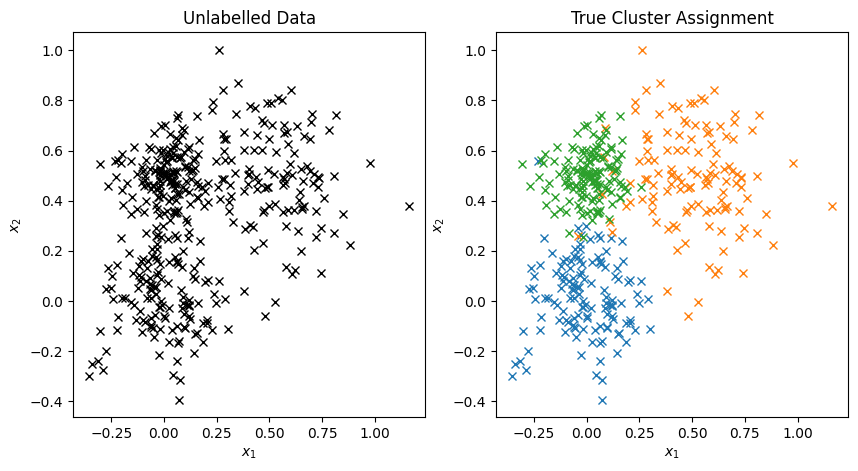

In [3]:
np.random.seed(1)

N_points = 400

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.02
var2 = 0.04
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0,0]),
        'cov' : var1*np.eye(2),
        },
    'c_1' : {
        'mu' : np.array([0.5,0.5]),
        'cov' : var2*np.eye(2),
        },
    'c_2' : {
        'mu' : np.array([0,0.5]),
        'cov' : var3*np.eye(2),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,2), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],X[:,1], 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_ylabel(r"$x_2$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],_x[:,1], 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_ylabel(r"$x_2$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

Each cluster is represented by a point called centroid, and data is iteratively assigned to clusters, with new centroid recomputation after data assignment until convergence. Depending on the number of centroids we arrive at different solutions. Different initializations also lead to different solutions. Most of the time we do not know how many clusters do we need to used, unless we can visualize the data or we have some domain knowledge.

#### 4 clusters

In [4]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )


kmeans = Kmeans(num_centroids = 4, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 1)
plotter.show_video()


/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 27.672
Running iteration 1 loss 18.995
Running iteration 2 loss 14.522
Running iteration 3 loss 14.094
Running iteration 4 loss 14.038
Running iteration 5 loss 14.019
Running iteration 6 loss 13.988
Running iteration 7 loss 13.967
Running iteration 8 loss 13.966
Running iteration 9 loss 13.966


In [5]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 4, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 10)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 24.839
Running iteration 1 loss 16.450
Running iteration 2 loss 14.247
Running iteration 3 loss 13.936
Running iteration 4 loss 13.891
Running iteration 5 loss 13.852
Running iteration 6 loss 13.802
Running iteration 7 loss 13.757
Running iteration 8 loss 13.727
Running iteration 9 loss 13.682
Running iteration 10 loss 13.658
Running iteration 11 loss 13.650
Running iteration 12 loss 13.646
Running iteration 13 loss 13.645
Running iteration 14 loss 13.645


#### 3 clusters

In [6]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 1)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 32.265
Running iteration 1 loss 24.112
Running iteration 2 loss 17.207
Running iteration 3 loss 15.915
Running iteration 4 loss 15.844
Running iteration 5 loss 15.841
Running iteration 6 loss 15.838
Running iteration 7 loss 15.833
Running iteration 8 loss 15.833


In [7]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 10)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 45.493
Running iteration 1 loss 34.764
Running iteration 2 loss 30.069
Running iteration 3 loss 25.456
Running iteration 4 loss 19.051
Running iteration 5 loss 16.329
Running iteration 6 loss 15.938
Running iteration 7 loss 15.841
Running iteration 8 loss 15.838
Running iteration 9 loss 15.833
Running iteration 10 loss 15.833


#### 10 clusters

In [8]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 10, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 1)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 9.405
Running iteration 1 loss 7.597
Running iteration 2 loss 6.968
Running iteration 3 loss 6.811
Running iteration 4 loss 6.716
Running iteration 5 loss 6.681
Running iteration 6 loss 6.654
Running iteration 7 loss 6.630
Running iteration 8 loss 6.621
Running iteration 9 loss 6.614
Running iteration 10 loss 6.588
Running iteration 11 loss 6.580
Running iteration 12 loss 6.580


In [9]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 10, plotter = plotter)
kmeans.run(X, num_iters = 40, seed = 10)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 10.606
Running iteration 1 loss 8.039
Running iteration 2 loss 7.382
Running iteration 3 loss 7.053
Running iteration 4 loss 6.810
Running iteration 5 loss 6.638
Running iteration 6 loss 6.542
Running iteration 7 loss 6.485
Running iteration 8 loss 6.456
Running iteration 9 loss 6.447
Running iteration 10 loss 6.430
Running iteration 11 loss 6.409
Running iteration 12 loss 6.369
Running iteration 13 loss 6.348
Running iteration 14 loss 6.332
Running iteration 15 loss 6.322
Running iteration 16 loss 6.307
Running iteration 17 loss 6.296
Running iteration 18 loss 6.243
Running iteration 19 loss 6.168
Running iteration 20 loss 6.139
Running iteration 21 loss 6.081
Running iteration 22 loss 6.049
Running iteration 23 loss 5.995
Running iteration 24 loss 5.981
Running iteration 25 loss 5.961
Running iteration 26 loss 5.951
Running iteration 27 loss 5.941
Running iteration 28 loss 5.934
Running iteration 29 loss 5.934
Running iteration 30 loss 5.933
Running iteration

The kmeans algorithm is, obviously, independent of the data dimension. We can run it on 1 dimensional data and display clusters, yet not so visual.

Consider the following data, again drawn using a mixture distribution

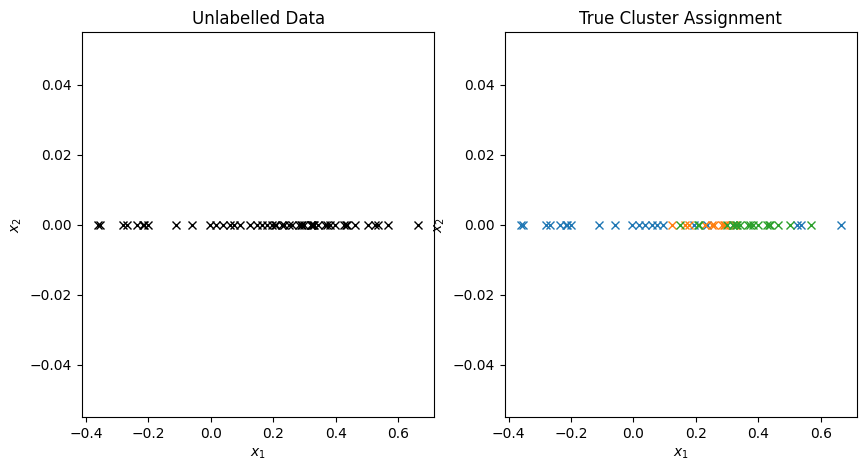

In [10]:
np.random.seed(1)

N_points = 50

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.01
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([0.2]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([0.35]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_ylabel(r"$x_2$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_ylabel(r"$x_2$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

In [11]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 10)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 1.419
Running iteration 1 loss 0.889
Running iteration 2 loss 0.639
Running iteration 3 loss 0.544
Running iteration 4 loss 0.521
Running iteration 5 loss 0.500
Running iteration 6 loss 0.475
Running iteration 7 loss 0.475


## Algorithm 

Usually, in machine learning, we start by defining the functional form of the model, the loss function, and the associated optimization proceedure.

For example in linear regression, the model is the set of all possible hyperplanes parameterized by $w$, the associated loss function can be the squared loss, and the optimization proceedure could be exact method (known also as least squares due to its connection to how Linear Systems solutions can be obtained when exact solution cannot be computed), gradient descent, steepest gradient descent, or coordinate descent among others.

In Kmeans is rather more intuitive to start with the algorithm, since arriving at this algorithm from the model form and loss function does not provide and intuitive understanding of the algorithm.

The Kmeans algorithm have different steps.

* 1.  Initialization. Select the number of centroids to obtain and initialize them to any value. This could be done by selecting random points from the dataset, by selecting random point from the space of points, or advanced techniques such as the kmeans++ algorithm.

After initialization iterate the following steps:

* 2. Assign each datapoint to its closest centroid wrt some norm. The $L_2$ norm is usually used and is the one which connects with Gaussian Mixture Model.
* 3. Recompute centroids by the sample mean of the datapoints assigned to each of the clusters.

Assume we have $N$ datapoints, with $K$ clusters $S=\{S_1,\dots,S_K\}$. Each point is denoted by $x_n \in \mathbb{R}^d$, each cluster centroid by $\mu_k$ and $c_n$ denotes the cluster being assigned to each $x_n$. Denote by $\mu = \{\mu_1,\mu_2,\dots,\mu_K\}$ and $c = \{c_1,c_2,\dots,c_n\}$.


Mathematically we have:

* step 2:

\begin{split}
c_n = \underset{k}{\text{argmin}}\mid\mid x_n - \mu_k \mid\mid^2
\end{split}

* step 3: For each cluster $c$:

\begin{split}
\mu_k = \frac{1}{\mid S_k \mid}\sum_{x_i \in S_k} x_i
\end{split}

**Algorithm derivation**: We can arrive at this algorithm via two different paths (up to my knowledge).
* 1. Through maximum likelihood of a Gaussian Mixture model with non-learnable variances, optimized with the EM algorithm, which is a coordinate descent algorithm over parameter values (step 3) and probability distributions (step 2)
* 2. By defining a loss function which is optimized through coordinate descent over cluster assignments (step 2= and centroid computations (step 3). We will refer to this approach as the loss function approach and is the one we study now.

As we see above step 2 is clearly a minimization problem. Step 3 is the solution to the other minimization problem that arises when optimizing over the other coordinates, the centroid values. Due to the form of the solution (which is unique) we can easily observe that step 3's minimization function is convex. In other words, given fix cluster assignments $c_n$, optimizing over $\mu$ is a convex minimization problem whose minimumn is the sample mean of points assigned to the cluster. 

## Loss function approach

The non-probabilistic approach to kmeans starts by defining the following loss function to be optimized. This loss function is also known as the within cluster sum of squares, which is basically the variance. In other words, we wish to minimize the variance from the clusters generated, which makes sense because the smaller the variance the more conentrated the points are in each cluster, which is equivalent to maximizing the sum of squared deviations between points in different clusters.

\begin{split}
L(c,\mu,x) = \sum^K_{k=1}\sum_{x_i \in S_k}\mid\mid x_i - \mu_k \mid\mid^2
\end{split}

The optimization proceedure wish to find both cluster centroids $\mu_c$ and optimal cluster assignments $c_n$. This means the optimization is defined by:

\begin{split}
\underset{c,\mu}{\text{argmin}}\,\,L(c,\mu,x)
\end{split}

Minizming this function cannot be done by exact methods nor by gradient descent, because we wish to obtain optimal cluster assignments $c_n$ which are discrete variables, and so gradient is not defined. It turns out that a coordinate descent approach can be used to solve this problem and lead to the algorithm described above.


### Functional form of the loss function.

The loss function from the loss function approach is non-convex and mixes both continuous variables, the centroids $\mu_k$, and discrete variables, the cluster datapoint assignments $c_n$. To explicitely state this dependence we can rewrite the loss funciton in the usual form:

\begin{split}
L(c,\mu,x) = \sum^K_{k=1}\sum_{n=1}^N r_{nk}\mid\mid x_n - \mu_k \mid\mid^2
\end{split}

where $r_{nk}$ is an indicator variable such that:

\begin{split}
r_{nk} = \begin{cases}
1, c_n = k\\
0, c_n \neq k
\end{cases}
\end{split}

Note that here we have $K$ continous variables $\mu_k \in \mathbb{R}^d$ and $N$ discrete variables $c_n \in \mathbb{N}$.  Thus loss function can only be plotted when some variables get fixed and vary others, as we have done with linear regression. Since cluster assignments are discrete the optimization function is weird to be visualized, and so we will be showing the loss function varying centroid values. 

Note that, whenever a cluster value changes, it does the cluster assignments and thus we will see that the loss function has non-smooth changes, which correspond when a cluster assignment has change. However, within the same cluster assignment we will see that the loss funciton is convex and there is a unique minimum of this loss within a cluster assignment.

### Loss function for 1 dimensional data

#### 2 clusters N = 3 

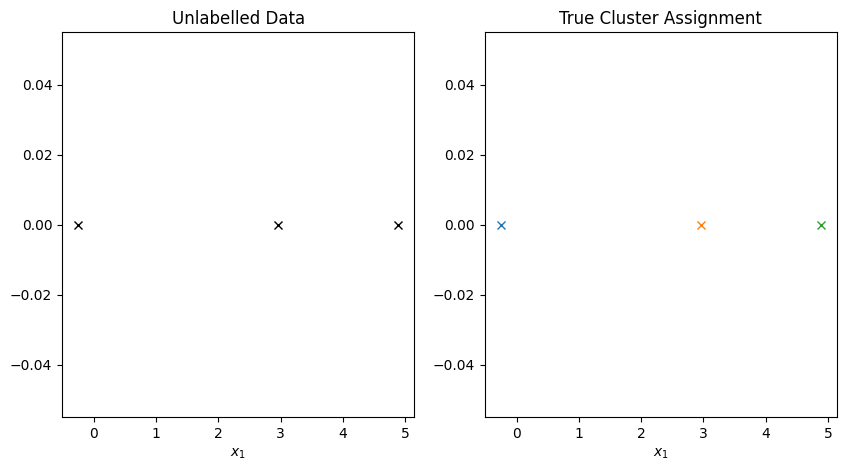

In [12]:
np.random.seed(1)

N_points = 3

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.01
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([3]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([5]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


array([[2.9551122],
       [4.8894067]], dtype=float32)

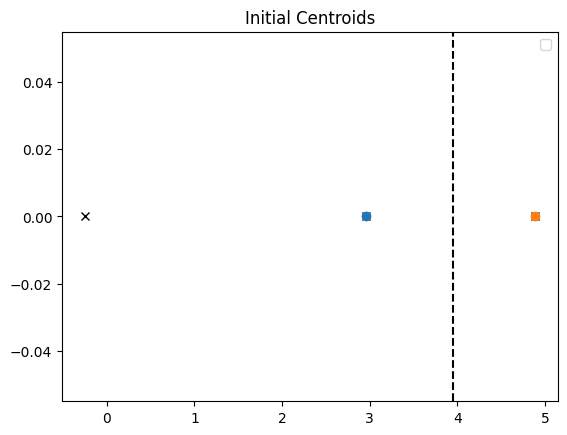

In [13]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

In [14]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 40
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [15]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 40
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = True
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


/tmp/ipykernel_1118662/2142099129.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[0].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
/tmp/ipykernel_1118662/2142099129.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[1].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))


Text(0.5, 0.5, 'centroid 1')

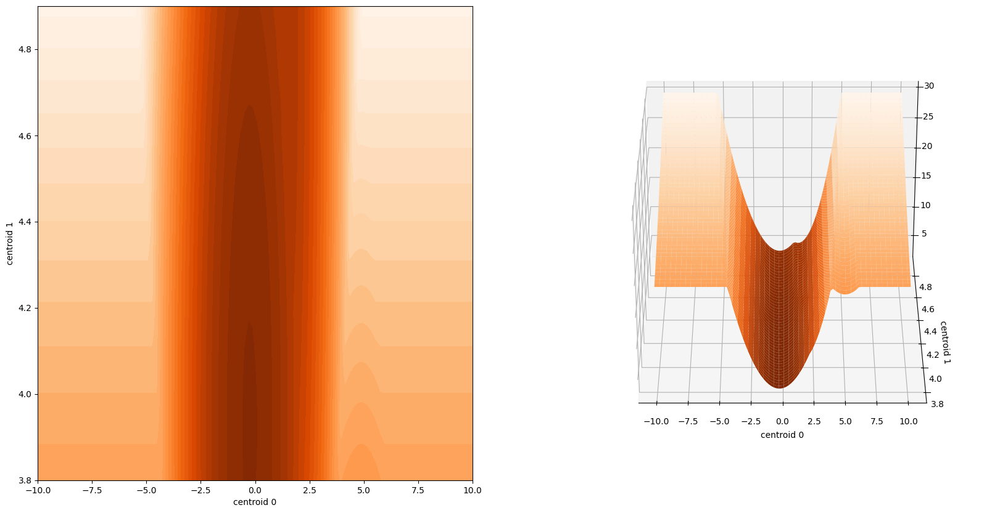

In [16]:
N_grid = 100

grid_lim_l_c0 = -10
grid_lim_u_c0 = 10

grid_lim_l_c1 = 3.8
grid_lim_u_c1 = 4.9
cA_coord_mesh,cB_coord_mesh = np.meshgrid(np.linspace(grid_lim_l_c0,grid_lim_u_c0,N_grid),np.linspace(grid_lim_l_c1,grid_lim_u_c1,N_grid))
c_mesh = np.hstack((np.reshape(cA_coord_mesh, (N_grid**2,1)),np.reshape(cB_coord_mesh, (N_grid**2,1))))
c_mesh = c_mesh[:,:, np.newaxis]


fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1, 2, 1) 
ax2 = fig.add_subplot(1, 2, 2, projection='3d')  
ax2.view_init(elev=30, azim=-90)

ax_list = [ax1, ax2]

## Get parameters and/or variables which are fixed 
locally_convex = False
true_centroids_assigned, true_X_assigned  = kmeans._assign_data_to_centroids(X)


## ====================
## Parameter to vary ##
# both clusters at the same time
loss_acc = []
for centroids in c_mesh:
    
    # print(c_mesh)
    
    if locally_convex:
        centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
    else:
        centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

    loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
    loss_acc.append(loss)

loss_acc_mesh = np.reshape(np.array(loss_acc), (N_grid,N_grid))

ax_list[0].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
ax_list[1].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))

ax_list[0].set_xlabel("centroid 0")
ax_list[0].set_ylabel("centroid 1")

ax_list[1].set_xlabel("centroid 0")
ax_list[1].set_ylabel("centroid 1")


#### 2 clusters N = 8

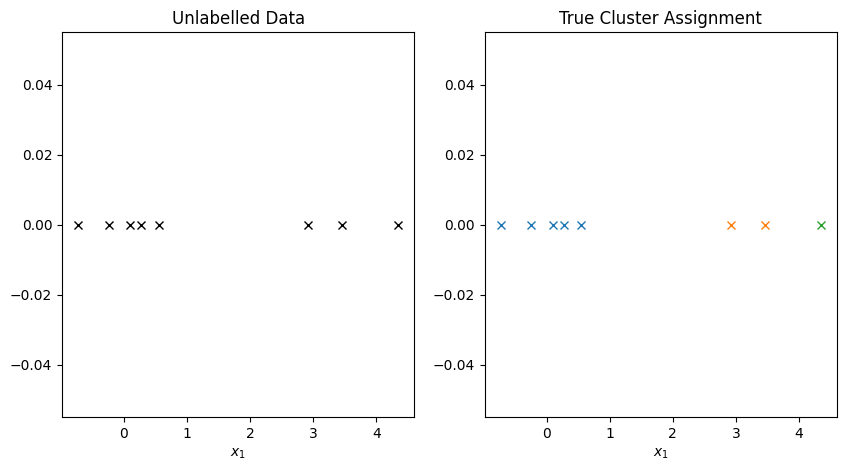

In [17]:
np.random.seed(1)

N_points = 8

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.1
var3 = 0.1
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([3]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([5]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


array([[ 4.3485265 ],
       [-0.24071476]], dtype=float32)

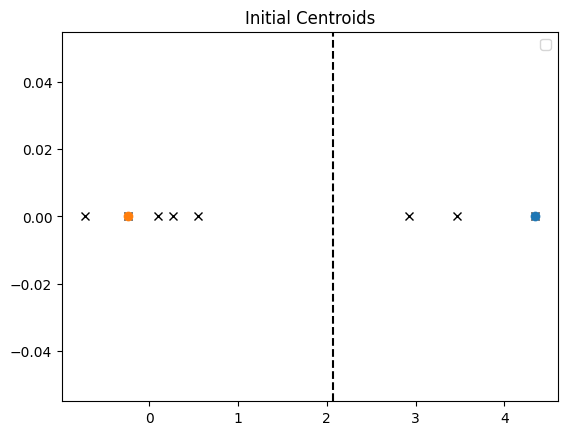

In [18]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

In [19]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 50
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [20]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 50
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = True
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans_loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


/tmp/ipykernel_1118662/2520862968.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[0].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
/tmp/ipykernel_1118662/2520862968.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[1].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))


Text(0.5, 0.5, 'centroid 1')

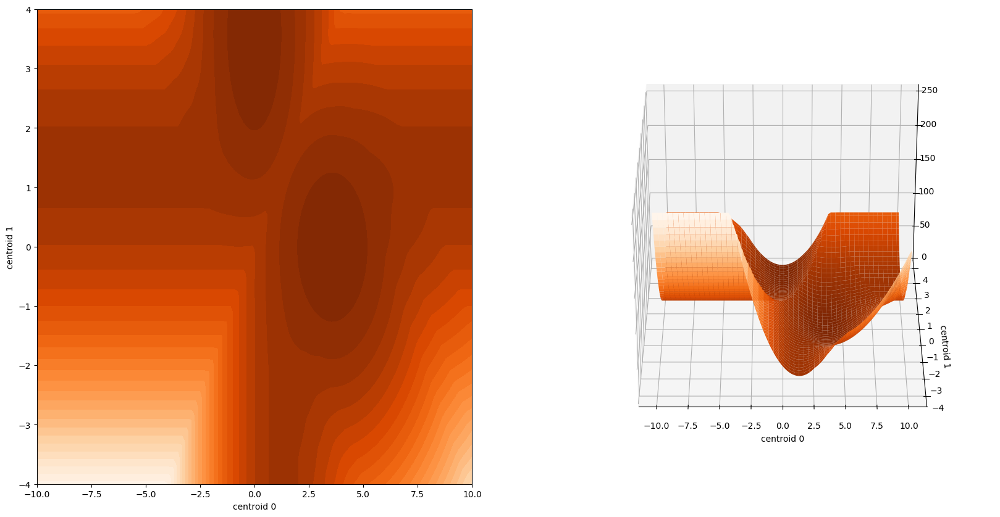

In [21]:
N_grid = 100

grid_lim_l_c0 = -10
grid_lim_u_c0 = 10

grid_lim_l_c1 = -4
grid_lim_u_c1 = 4
cA_coord_mesh,cB_coord_mesh = np.meshgrid(np.linspace(grid_lim_l_c0,grid_lim_u_c0,N_grid),np.linspace(grid_lim_l_c1,grid_lim_u_c1,N_grid))
c_mesh = np.hstack((np.reshape(cA_coord_mesh, (N_grid**2,1)),np.reshape(cB_coord_mesh, (N_grid**2,1))))
c_mesh = c_mesh[:,:, np.newaxis]


fig = plt.figure(figsize=(20, 10))
ax1 = fig.add_subplot(1, 2, 1) 
ax2 = fig.add_subplot(1, 2, 2, projection='3d')  
ax2.view_init(elev=30, azim=-90)

ax_list = [ax1, ax2]

## Get parameters and/or variables which are fixed 
locally_convex = False
true_centroids_assigned, true_X_assigned  = kmeans._assign_data_to_centroids(X)


## ====================
## Parameter to vary ##
# both clusters at the same time
loss_acc = []
for centroids in c_mesh:
    
    # print(c_mesh)
    
    if locally_convex:
        centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
    else:
        centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

    loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
    loss_acc.append(loss)

loss_acc_mesh = np.reshape(np.array(loss_acc), (N_grid,N_grid))

ax_list[0].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
ax_list[1].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))

ax_list[0].set_xlabel("centroid 0")
ax_list[0].set_ylabel("centroid 1")

ax_list[1].set_xlabel("centroid 0")
ax_list[1].set_ylabel("centroid 1")

#### 3 clusters N = 8

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


array([[ 4.3485265 ],
       [-0.24071476],
       [-0.72781044]], dtype=float32)

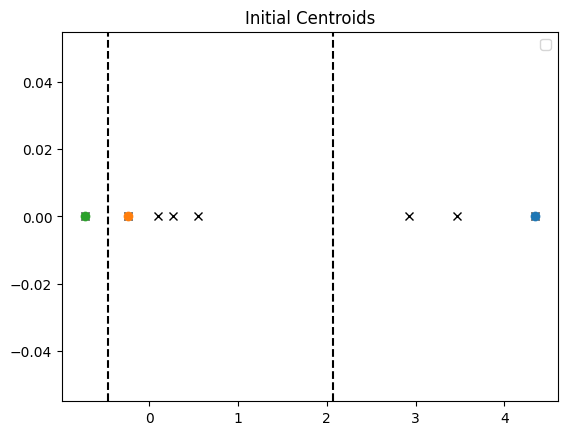

In [22]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.1, 
                        draw_voronoi = True,
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

In [23]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 100
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans.loss_function(X, centroids = centroids,  X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(0,len(c_coord_range),5):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [24]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 100
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = True
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans.loss_function(X, centroids = centroids,  X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(0,len(c_coord_range),5):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


### Loss function for 2 dimensional data

Let's increase the dimensionality of the problem and consider data in $\mathbb{R}^2$. We can plot the marginal loss function at some coordinate for some centroid, or the joint loss function considering different combination of coordinates between centroids, or a centroid itself.

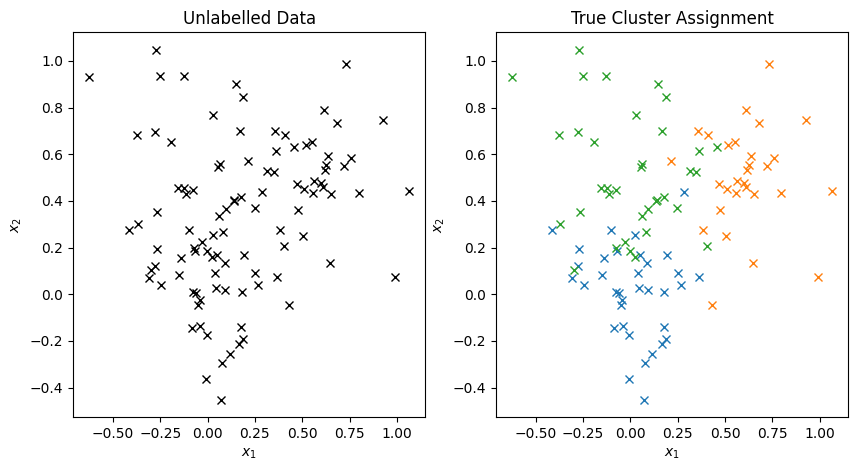

In [25]:
np.random.seed(1)

N_points = 100

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
p_xc = {
    'c_0' : {
        'mu' : np.array([0,0]),
        'cov' : 0.05*np.eye(2),
        },
    'c_1' : {
        'mu' : np.array([0.5,0.5]),
        'cov' : 0.05*np.eye(2),
        },
    'c_2' : {
        'mu' : np.array([0,0.5]),
        'cov' : 0.05*np.eye(2),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X_clust = {}
X = np.zeros((N_points,2), dtype = np.float32)
counter = 0
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c


fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],X[:,1], 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_ylabel(r"$x_2$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],_x[:,1], 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_ylabel(r"$x_2$")
    ax2.set_title("True Cluster Assignment")

## shuffle data
for i in range(10):
    np.random.shuffle(X)

Then I will use run the kmean algorithm:

In [26]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        # loss_fun_optim = True,
                        # num_loss_fun_centroids_to_show = 3 
                      )

kmeans = Kmeans(num_centroids = 4, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 1)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:538: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


Running iteration 0 loss 7.326
Running iteration 1 loss 6.897
Running iteration 2 loss 6.865
Running iteration 3 loss 6.865


I will fix $c_n$ to the assignments obtained after fitting the algorithm using the optimal centroids. With this fixed value for $c_n$ is time to see loss function varying centroid values. I will vary the values of different parts of $\mu_k$ fixing the others to the ones obtained after running the algorithm.

#### 1d Loss function

First, I will show the loss function fixing all parameters except a single coordinate of each centroid.

/tmp/ipykernel_1118662/3312593684.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap("Oranges")


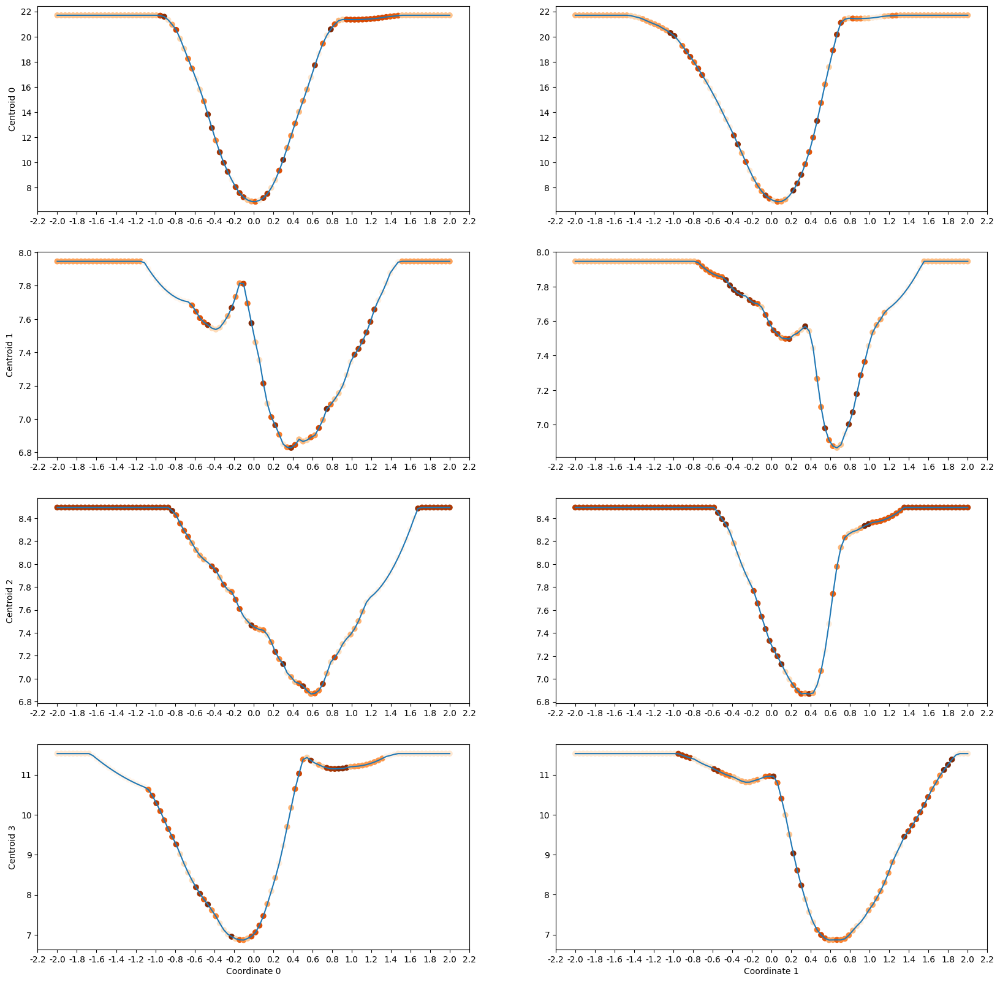

In [27]:
# Plotting specifications
N_grid = 100
grid_lim_l = -2
grid_lim_u = 2
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))

fig, ax_list = plt.subplots(kmeans.num_centroids,2, figsize = (20,20))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)


## ====================
## Parameter to vary ##
## Centroid and coordinate

for cent2change in range(kmeans.num_centroids):
    for coord2change in range(2):
        
        ## to separate the cost function within the different assignments
        assigned_regions = []
        
        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        if coord2change == 1:
            c_range = np.hstack((centroids[cent2change,0]*np.ones((N_grid,1)),c_coord_range))    

        elif coord2change == 0:
            c_range = np.hstack((c_coord_range,centroids[cent2change,1]*np.ones((N_grid,1))))

        else:
            raise ValueError("")

        loss_acc = []
        for _c in c_range:
            centroids[cent2change,:] = _c
            
            if locally_convex:
                centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
            else:
                centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)
            
            assigned_regions.append(tuple(centroids_assigned))
            
            loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
            loss_acc.append(loss)

    
        unique_assignments = list(set(assigned_regions))
        region_colors = [unique_assignments.index(a) for a in assigned_regions]
        
        region_colors = np.array(region_colors)
        region_colors = (region_colors - region_colors.min()) / (region_colors.max() - region_colors.min())
        
        colormap = plt.cm.get_cmap("Oranges") 
        region_colors = colormap(region_colors)
        #region_colors = [tuple(c) for c in region_colors]
        
        ax_list[cent2change,coord2change].plot(c_coord_range, loss_acc, c = 'C0')
        ax_list[cent2change,coord2change].scatter(c_coord_range, loss_acc, c = region_colors)
        
        ax_list[cent2change,coord2change].xaxis.set_major_locator(MultipleLocator(0.2))
        ax_list[cent2change,coord2change].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        if coord2change == 0:
            ax_list[cent2change,coord2change].set_ylabel(f"Centroid {cent2change}")
            
        if cent2change == kmeans.num_centroids-1:
            ax_list[cent2change,coord2change].set_xlabel(f"Coordinate {coord2change}")

/tmp/ipykernel_1118662/3397090893.py:55: RuntimeWarning: invalid value encountered in divide
  region_colors = (region_colors - region_colors.min()) / (region_colors.max() - region_colors.min())
/tmp/ipykernel_1118662/3397090893.py:57: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap("Oranges")


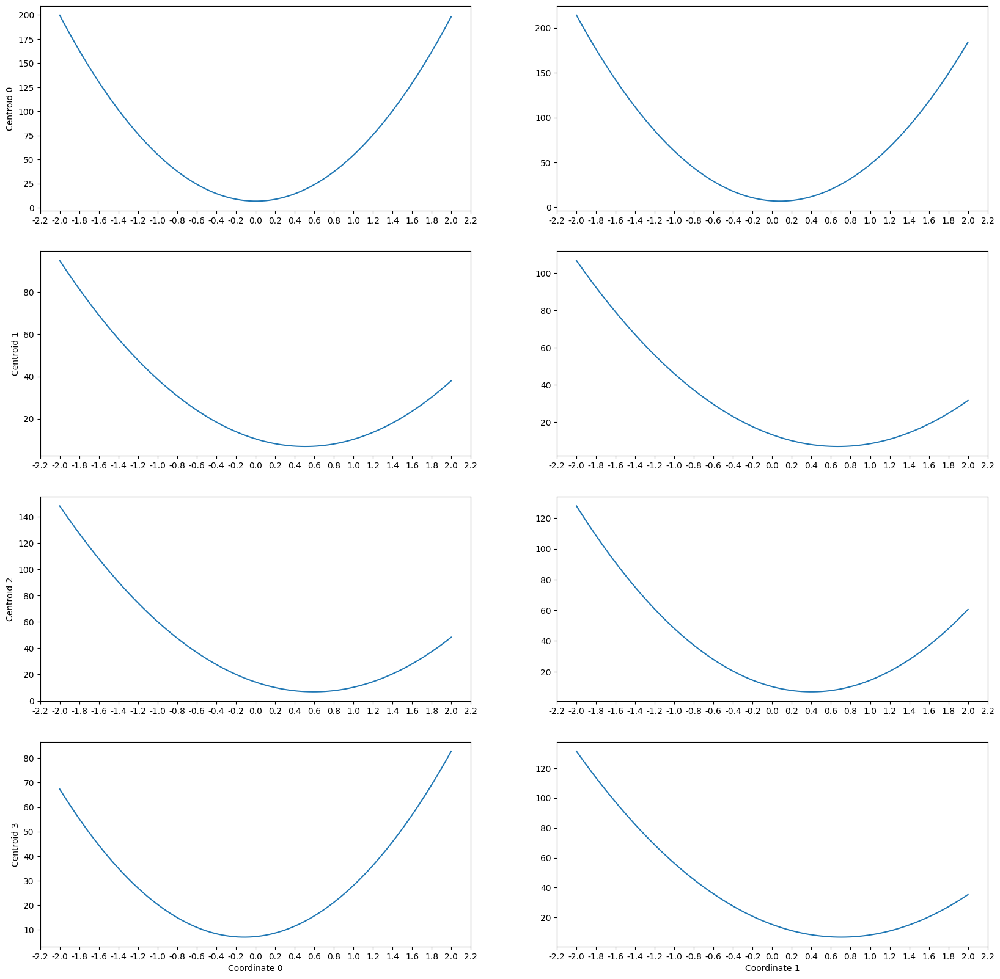

In [28]:
# Plotting specifications
N_grid = 100
grid_lim_l = -2
grid_lim_u = 2
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))

fig, ax_list = plt.subplots(kmeans.num_centroids,2, figsize = (20,20))

## Locally convex vs wthing assginment change
locally_convex = True
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)


## ====================
## Parameter to vary ##
## Centroid and coordinate

for cent2change in range(kmeans.num_centroids):
    for coord2change in range(2):
        
        ## to separate the cost function within the different assignments
        assigned_regions = []
        
        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        if coord2change == 1:
            c_range = np.hstack((centroids[cent2change,0]*np.ones((N_grid,1)),c_coord_range))    

        elif coord2change == 0:
            c_range = np.hstack((c_coord_range,centroids[cent2change,1]*np.ones((N_grid,1))))

        else:
            raise ValueError("")

        loss_acc = []
        for _c in c_range:
            centroids[cent2change,:] = _c
            
            if locally_convex:
                centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
            else:
                centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)
            
            assigned_regions.append(tuple(centroids_assigned))
            
            loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
            loss_acc.append(loss)

    
        unique_assignments = list(set(assigned_regions))
        region_colors = [unique_assignments.index(a) for a in assigned_regions]
        
        region_colors = np.array(region_colors)
        region_colors = (region_colors - region_colors.min()) / (region_colors.max() - region_colors.min())
        
        colormap = plt.cm.get_cmap("Oranges") 
        region_colors = colormap(region_colors)
        #region_colors = [tuple(c) for c in region_colors]
        
        ax_list[cent2change,coord2change].plot(c_coord_range, loss_acc, c = 'C0')
        ax_list[cent2change,coord2change].scatter(c_coord_range, loss_acc, c = region_colors)
        
        ax_list[cent2change,coord2change].xaxis.set_major_locator(MultipleLocator(0.2))
        ax_list[cent2change,coord2change].xaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        if coord2change == 0:
            ax_list[cent2change,coord2change].set_ylabel(f"Centroid {cent2change}")
            
        if cent2change == kmeans.num_centroids-1:
            ax_list[cent2change,coord2change].set_xlabel(f"Coordinate {coord2change}")

#### 2d Loss function showing single centroid

Time for the loss function varying each centroid along both coordinates.

[[ 0.00390645  0.07791451]
 [ 0.5086264   0.6712647 ]
 [ 0.5945762   0.4009136 ]
 [-0.11362769  0.70540464]]


/tmp/ipykernel_1118662/941389232.py:50: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[cent2change][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"))
/tmp/ipykernel_1118662/941389232.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[cent2change][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"), levels = 30)


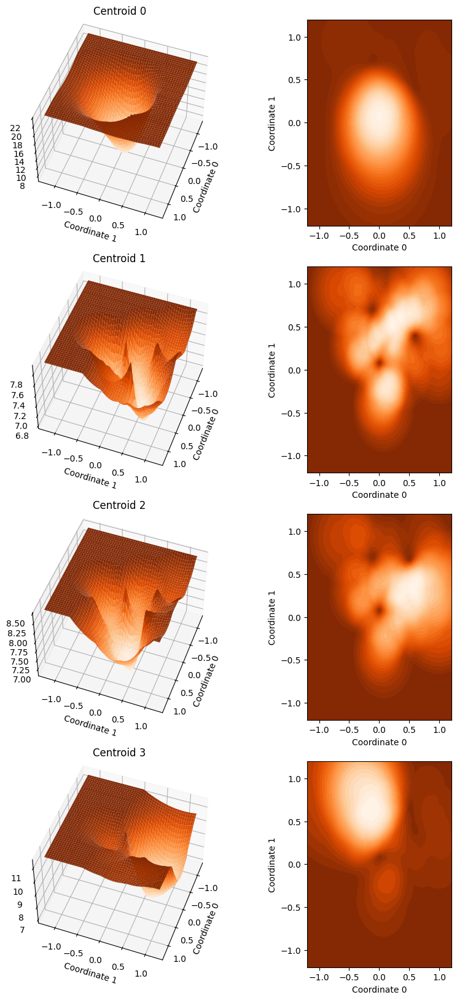

In [29]:
print(kmeans.centroids)

N_grid = 100
grid_lim_l = -1.2
grid_lim_u = 1.2

cA_coord_mesh,cB_coord_mesh = np.meshgrid(np.linspace(grid_lim_l,grid_lim_u,N_grid),np.linspace(grid_lim_l,grid_lim_u,N_grid))
c_mesh = np.hstack((np.reshape(cA_coord_mesh, (N_grid**2,1)),np.reshape(cB_coord_mesh, (N_grid**2,1))))


fig = plt.figure(figsize=(10, 20))  
gs = gridspec.GridSpec(4, 2, width_ratios=[2.0, 1])  

ax_list = []

for i in range(4):
    ax1 = fig.add_subplot(gs[i, 0], projection='3d')  
    ax1.view_init(elev=50, azim=20)

    ax2 = fig.add_subplot(gs[i, 1])  

    ax_list.append([ax1, ax2])
    
## Get parameters and/or variables which are fixed 
locally_convex = False
true_centroids_assigned, true_X_assigned  = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## There are eight combination
for cent2change in range(4):
    
    ## Get centroids from the algorithm
    centroids = copy.deepcopy(kmeans.centroids)

    loss_acc = []
    for _c in c_mesh:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)
        
        loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc.append(loss)

    loss_acc_mesh = np.reshape(np.array(loss_acc), (N_grid,N_grid))

    ax_list[cent2change][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"))
    ax_list[cent2change][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"), levels = 30)

    ax_list[cent2change][0].set_title(f"Centroid {cent2change}")
    
    ax_list[cent2change][0].set_xlabel(f"Coordinate {0}")
    ax_list[cent2change][0].set_ylabel(f"Coordinate {1}")
    ax_list[cent2change][1].set_xlabel(f"Coordinate {0}")
    ax_list[cent2change][1].set_ylabel(f"Coordinate {1}")

/tmp/ipykernel_1118662/1278711741.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[cent2change][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"))
/tmp/ipykernel_1118662/1278711741.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[cent2change][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"), levels = 30)


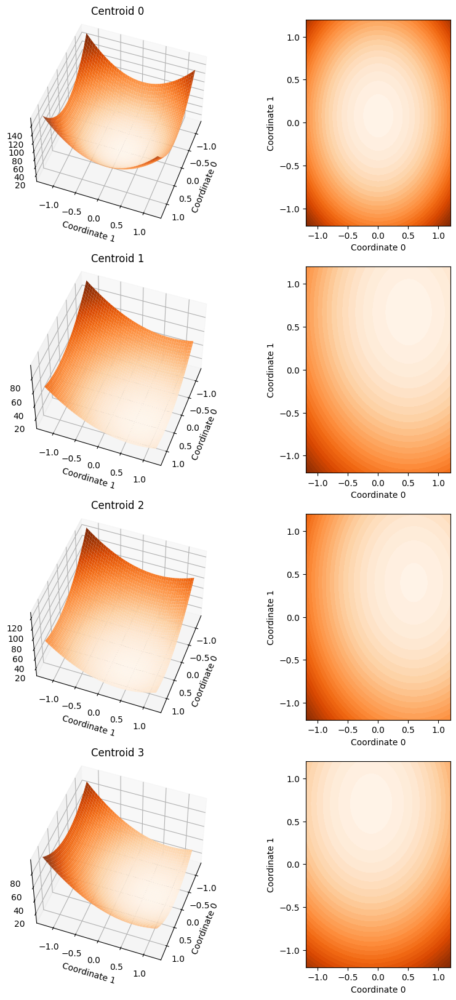

In [30]:
N_grid = 100
grid_lim_l = -1.2
grid_lim_u = 1.2

cA_coord_mesh,cB_coord_mesh = np.meshgrid(np.linspace(grid_lim_l,grid_lim_u,N_grid),np.linspace(grid_lim_l,grid_lim_u,N_grid))
c_mesh = np.hstack((np.reshape(cA_coord_mesh, (N_grid**2,1)),np.reshape(cB_coord_mesh, (N_grid**2,1))))


fig = plt.figure(figsize=(10, 20))  
gs = gridspec.GridSpec(4, 2, width_ratios=[2.0, 1])  

ax_list = []

for i in range(4):
    ax1 = fig.add_subplot(gs[i, 0], projection='3d')  
    ax1.view_init(elev=50, azim=20)

    ax2 = fig.add_subplot(gs[i, 1])  

    ax_list.append([ax1, ax2])
    
## Get parameters and/or variables which are fixed 
locally_convex = True
true_centroids_assigned, true_X_assigned  = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## There are eight combination
for cent2change in range(4):
    
    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    loss_acc = []
    for _c in c_mesh:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)
        
        loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc.append(loss)

    loss_acc_mesh = np.reshape(np.array(loss_acc), (N_grid,N_grid))

    ax_list[cent2change][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"))
    ax_list[cent2change][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges"), levels = 30)

    ax_list[cent2change][0].set_title(f"Centroid {cent2change}")
    
    ax_list[cent2change][0].set_xlabel(f"Coordinate {0}")
    ax_list[cent2change][0].set_ylabel(f"Coordinate {1}")
    ax_list[cent2change][1].set_xlabel(f"Coordinate {0}")
    ax_list[cent2change][1].set_ylabel(f"Coordinate {1}")

#### 2d Loss function comparing centroid's coordinates

Time for the loss function varying different coordinates of different centroids.

/tmp/ipykernel_1118662/2882074556.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[idx][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))
/tmp/ipykernel_1118662/2882074556.py:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[idx][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)


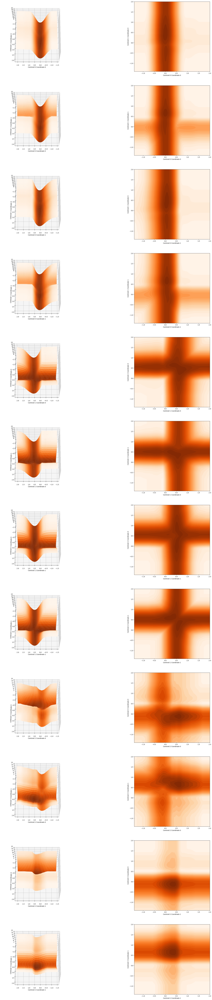

In [31]:
N_grid = 100
grid_lim_l = -1.4
grid_lim_u = 2

cA_coord_range,cB_coord_range = np.linspace(grid_lim_l,grid_lim_u,N_grid), np.linspace(grid_lim_l,grid_lim_u,N_grid)
cA_coord_mesh, cB_coord_mesh = np.meshgrid(cA_coord_range,cB_coord_range)

combinations = [
    [(0,0),(1,0)], # centroid 0 coordinate 0 vs centroid 1 coordinate 0
    [(0,0),(1,1)],
    [(0,1),(1,0)],
    [(0,1),(1,1)],
    #
    [(1,0),(2,0)], 
    [(1,0),(2,1)],
    [(1,1),(2,0)],
    [(1,1),(2,1)],
    #
    [(2,0),(3,0)], 
    [(2,0),(3,1)],
    [(2,1),(3,0)],
    [(2,1),(3,1)],
    #
]

fig = plt.figure(figsize=(30, 120))  
gs = gridspec.GridSpec(len(combinations), 2, width_ratios=[2, 1])  

ax_list = []
for i in range(len(combinations)):
    ax1 = fig.add_subplot(gs[i, 0], projection='3d')  
    ax1.view_init(elev=70, azim=90)

    ax2 = fig.add_subplot(gs[i, 1])  

    ax_list.append([ax1, ax2])


## Get parameters and/or variables which are fixed 
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)


for idx, comb in enumerate(combinations):
    (c0,coord0),(c1,coord1) = comb
    
    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    ## ====================
    ## Parameter to vary ##
    ## There are eight combination
    loss_acc_mesh = np.zeros((N_grid, N_grid))
    for r,_cB in enumerate(cB_coord_range):
        for c,_cA in enumerate(cA_coord_range):

            centroids[c0,coord0] = _cA
            centroids[c1,coord1] = _cB
            
            if locally_convex:
                centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
            else:
                centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

            loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
            loss_acc_mesh[r,c] = loss

    ax_list[idx][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))
    ax_list[idx][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
    
    ax_list[idx][0].set_xlabel(f"Centroid {c0} Coordinate {coord0}")
    ax_list[idx][0].set_ylabel(f"Centroid {c1} Coordinate {coord1}")
    ax_list[idx][1].set_xlabel(f"Centroid {c0} Coordinate {coord0}")
    ax_list[idx][1].set_ylabel(f"Centroid {c1} Coordinate {coord1}")

/tmp/ipykernel_1118662/226167293.py:68: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[idx][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))
/tmp/ipykernel_1118662/226167293.py:69: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  ax_list[idx][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)


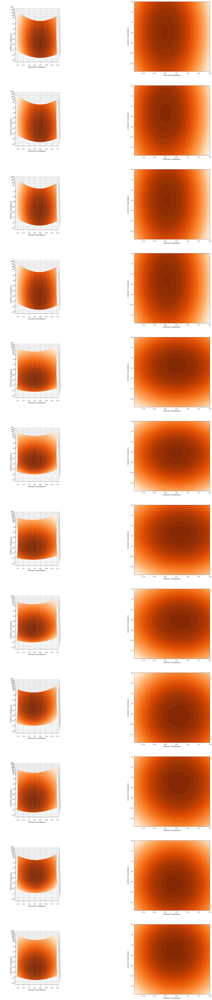

In [32]:
N_grid = 100
grid_lim_l = -1.4
grid_lim_u = 2

cA_coord_range,cB_coord_range = np.linspace(grid_lim_l,grid_lim_u,N_grid), np.linspace(grid_lim_l,grid_lim_u,N_grid)
cA_coord_mesh, cB_coord_mesh = np.meshgrid(cA_coord_range,cB_coord_range)

combinations = [
    [(0,0),(1,0)], # centroid 0 coordinate 0 vs centroid 1 coordinate 0
    [(0,0),(1,1)],
    [(0,1),(1,0)],
    [(0,1),(1,1)],
    #
    [(1,0),(2,0)], 
    [(1,0),(2,1)],
    [(1,1),(2,0)],
    [(1,1),(2,1)],
    #
    [(2,0),(3,0)], 
    [(2,0),(3,1)],
    [(2,1),(3,0)],
    [(2,1),(3,1)],
    #
]

fig = plt.figure(figsize=(30, 120))  
gs = gridspec.GridSpec(len(combinations), 2, width_ratios=[2, 1])  

ax_list = []
for i in range(len(combinations)):
    ax1 = fig.add_subplot(gs[i, 0], projection='3d')  
    ax1.view_init(elev=70, azim=90)

    ax2 = fig.add_subplot(gs[i, 1])  

    ax_list.append([ax1, ax2])


## Get parameters and/or variables which are fixed 
locally_convex = True
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)


for idx, comb in enumerate(combinations):
    (c0,coord0),(c1,coord1) = comb
    
    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    ## ====================
    ## Parameter to vary ##
    ## There are eight combination
    loss_acc_mesh = np.zeros((N_grid, N_grid))
    for r,_cB in enumerate(cB_coord_range):
        for c,_cA in enumerate(cA_coord_range):

            centroids[c0,coord0] = _cA
            centroids[c1,coord1] = _cB
            
            if locally_convex:
                centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
            else:
                centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

            loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
            loss_acc_mesh[r,c] = loss

    ax_list[idx][0].plot_surface(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"))
    ax_list[idx][1].contourf(cA_coord_mesh, cB_coord_mesh, loss_acc_mesh, cmap = plt.cm.get_cmap("Oranges_r"), levels = 30)
    
    ax_list[idx][0].set_xlabel(f"Centroid {c0} Coordinate {coord0}")
    ax_list[idx][0].set_ylabel(f"Centroid {c1} Coordinate {coord1}")
    ax_list[idx][1].set_xlabel(f"Centroid {c0} Coordinate {coord0}")
    ax_list[idx][1].set_ylabel(f"Centroid {c1} Coordinate {coord1}")

## Coordinate descent algorithm optimization: optimal steps

Let's now visualize how the coordinate descent algorithm works. There are two set of variables over which we optimize, which are the cluster assignments $c_n$ and cluster centroid values $\mu_k$. Coordinate descent alternates between fixing $\mu_k$ and get optimal $c_n$ (step 2 in the algorithm) and fixing $c_n$ and get optimal $\mu_k$ (step 3 in the algorithm). Within each coordinate step a group of variables is being optimized. For example step 3 get optimal values for all $mu_k$ at the same time because optimallity of each $\mu_k$ is independent of other optimal value $\mu_{k'}$

### 1 dimensional data

#### 2 clusters N = 3 points
Here is the data used.

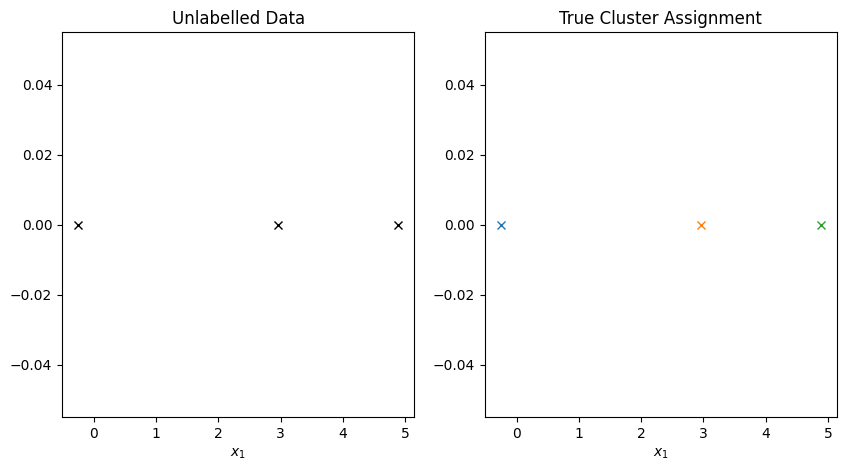

In [33]:
np.random.seed(1)

N_points = 3

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.01
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([3]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([5]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

Initial cluster assignments

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


array([[2.9551122],
       [4.8894067]], dtype=float32)

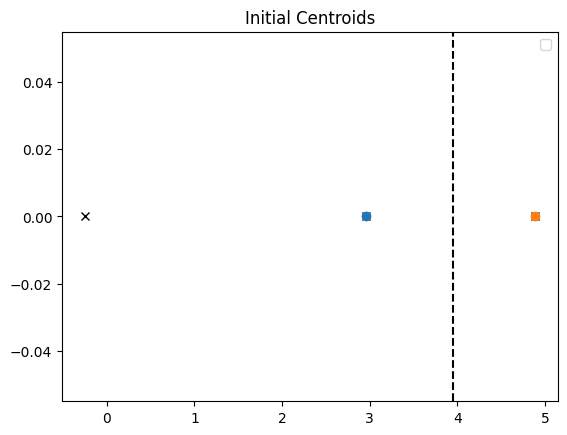

In [34]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = False,
                        num_loss_fun_centroids_to_show = 2
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

Loss function given initial centroids.

In [35]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 100
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Coordinate descent algorithm

In [36]:
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 2
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

kmeans.run(X, num_iters = 10, seed = 1)

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 1000) to (1008, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[rawvideo @ 0x786fd00] Stream #0: not enough frames to estimate rate; consider increasing probesize


Running iteration 0 loss 5.148
Running iteration 1 loss 5.148


#### 2 clusters N = 5 points

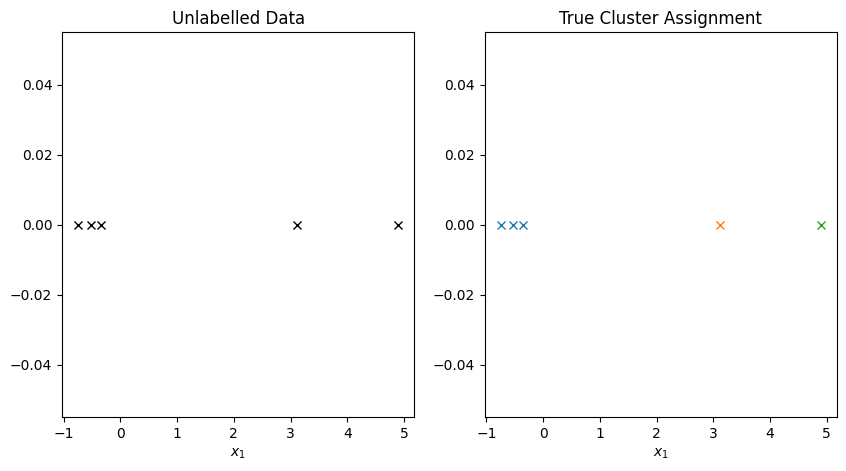

In [37]:
np.random.seed(1)

N_points = 5

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.01
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([3]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([5]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()


array([[-0.7473944],
       [-0.3497274]], dtype=float32)

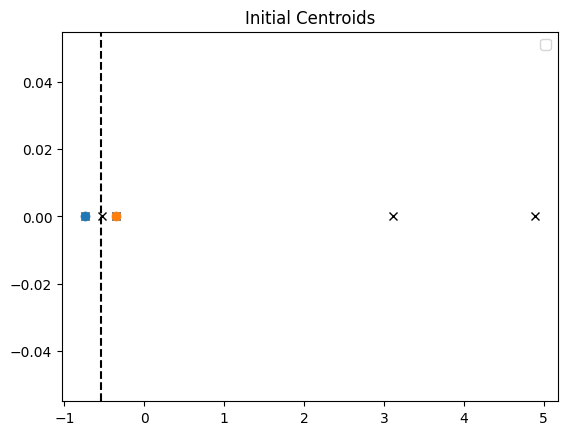

In [38]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = False,
                        num_loss_fun_centroids_to_show = 2
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.initialize_centroids(X, seed = 1) 

In [39]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 100
grid_lim_l = -10
grid_lim_u = 10
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [40]:
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 2
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.run(X, num_iters = 10, seed = 1) 

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 1000) to (1008, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[rawvideo @ 0x346a2d00] Stream #0: not enough frames to estimate rate; consider increasing probesize


Running iteration 0 loss 21.342
Running iteration 1 loss 1.672
Running iteration 2 loss 1.672


**Change initialization**

In [41]:
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 2
                      )

kmeans = Kmeans(num_centroids = 2, plotter = plotter)
kmeans.run(X, num_iters = 10, seed = 4) 

plotter.show_video()

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 1000) to (1008, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[rawvideo @ 0x22348d00] Stream #0: not enough frames to estimate rate; consider increasing probesize


Running iteration 0 loss 10.091
Running iteration 1 loss 1.672
Running iteration 2 loss 1.672


#### 3 clusters N = 50 points

If we recover back our initial dataset, which is far more complex, we see that the complexity and the number of solutions we can obtain increases. Here, initialization plays a role.

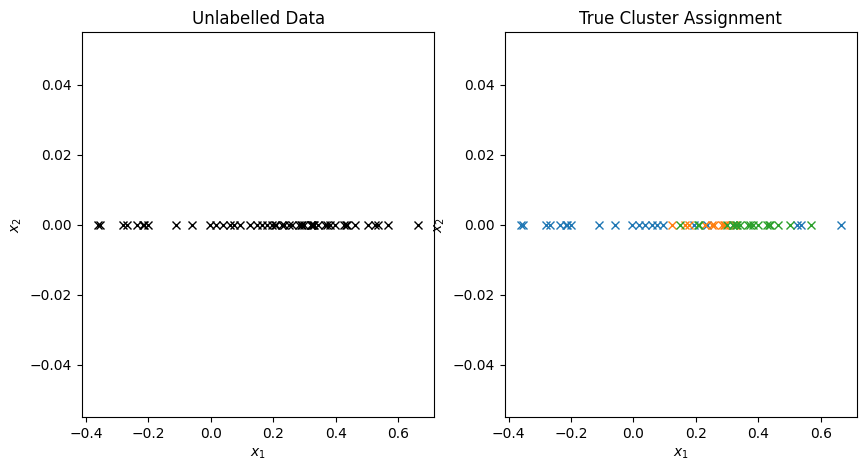

In [42]:
np.random.seed(1)

N_points = 50

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
var1 = 0.1
var2 = 0.01
var3 = 0.01
p_xc = {
    'c_0' : {
        'mu' : np.array([0]),
        'cov' : var1*np.eye(1),
        },
    'c_1' : {
        'mu' : np.array([0.2]),
        'cov' : var2*np.eye(1),
        },
    'c_2' : {
        'mu' : np.array([0.35]),
        'cov' : var3*np.eye(1),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,1), dtype = np.float32)
counter = 0
X_clust = {}
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c

fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],np.zeros_like(X), 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_ylabel(r"$x_2$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],np.zeros_like(_x), 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_ylabel(r"$x_2$")
    ax2.set_title("True Cluster Assignment")


## shuffle data
for i in range(10):
    np.random.shuffle(X)

In [43]:
# video creation
video_filename = "/tmp/aux.mp4"

## video writer
writer = imageio.get_writer(video_filename, format="FFMPEG", mode="I", fps=1, codec="libx264")  

# Plotting specifications
N_grid = 100
grid_lim_l = -1
grid_lim_u = 1
c_coord_range = np.reshape(np.linspace(grid_lim_l,grid_lim_u,N_grid),(N_grid,1))
vor_grid_xx = np.reshape( np.linspace(grid_lim_l, grid_lim_u, 500), (500,1))

fig_1, ax_list_1 = plt.subplots(kmeans.num_centroids,2, figsize = (10,5))

## Locally convex vs wthing assginment change
locally_convex = False
true_centroids_assigned, true_X_assigned = kmeans._assign_data_to_centroids(X)

## ====================
## Parameter to vary ##
## Centroid and coordinate

## to separate the cost function within the different assignments
assigned_regions = {}

# to keep loss
loss_acc = {}

# to keep region colors
region_colors = {}

for cent2change in range(kmeans.num_centroids):
    
    ## to separate the cost function within the different assignments
    assigned_regions[cent2change] = []

    ## Get centroids from the algorithm
    centroids = kmeans.centroids

    # to keep loss
    loss_acc[cent2change] = []
    
    for _c in c_coord_range:
        centroids[cent2change,:] = _c

        if locally_convex:
            centroids_assigned, X_assigned = true_centroids_assigned, true_X_assigned 
        else:
            centroids_assigned, X_assigned = kmeans._assign_data_to_centroids(X, centroids = centroids)

        assigned_regions[cent2change].append(tuple(centroids_assigned))

        loss = kmeans.loss_function(X, centroids = centroids, X_assigned = X_assigned)
        loss_acc[cent2change].append(loss)


    unique_assignments = list(set(assigned_regions[cent2change]))
    region_colors[cent2change] = [f"C{unique_assignments.index(a)}" for a in assigned_regions[cent2change]]
   
    ## ==================
    ## Draw loss function
    ax_list_1[cent2change][0].plot(c_coord_range, loss_acc[cent2change], c = 'C0')
    ax_list_1[cent2change][0].scatter(c_coord_range, loss_acc[cent2change], c = region_colors[cent2change])

    ax_list_1[cent2change][0].set_xlabel(f"Centroid {cent2change}")
    
       
## Draw how assignment changes and how it affecst loss function
for i in range(len(c_coord_range)):
    for cent2change in range(kmeans.num_centroids): 
        
        # get associated coordinates, loss and regions per centroid.
        _c,_loss,_cent_assigned = c_coord_range[i],loss_acc[cent2change][i],assigned_regions[cent2change][i]
        
        ax_list_1[cent2change][1].cla()

        # draw data assignment
        colors_data = [f"C{i}" for i in _cent_assigned]     
        ax_list_1[cent2change][1].scatter(X, np.zeros_like(X), marker = 'x',  c = colors_data)

        # highlight loss
        ax_list_1[cent2change][0].plot( _c, _loss, 'o' ,c = 'k')#, markersize =10)
        
        # remove previous highlighted
        if i != 0:
            ax_list_1[cent2change][0].plot(  c_coord_range[i-1], loss_acc[cent2change][i-1], 'o' , c = region_colors[cent2change][i-1])

        ## Get centroids from the algorithm
        centroids = kmeans.centroids

        # centroid
        centroids[cent2change,:] = _c

        ## draw centroid
        for idx,cet in enumerate(centroids):
            ## plot centroids
            ax_list_1[cent2change][1].plot(cet,0.0, 'o', color = f'C{idx}')

        ## draw voronoi regions
        voronoi_regions, _ = assign_data_to_centroids(vor_grid_xx , centroids)
        voronoi_regions_limits = np.where(np.diff(voronoi_regions) != 0)[0] + 1

        for c in voronoi_regions_limits:
            ax_list_1[cent2change][1].axvline(vor_grid_xx[c], color='k', linestyle="--")
            
        # fix xlim
        ax_list_1[cent2change][1].set_xlim([grid_lim_l, grid_lim_u])
        

    buf = BytesIO()
    fig_1.savefig(buf, format="png", dpi=100)

    buf.seek(0)
    frame = imageio.imread(buf) 
    writer.append_data(frame)

writer.close()     

display(Video(data=video_filename, embed=True))
os.remove(video_filename)
plt.close(fig_1)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 500) to (1008, 512) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [44]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 3 
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.run(X, num_iters = 10, seed = 10)

plotter.show_video()
print(kmeans.centroids)

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 1000) to (1008, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[rawvideo @ 0x2c46fd00] Stream #0: not enough frames to estimate rate; consider increasing probesize


Running iteration 0 loss 1.419
Running iteration 1 loss 0.889
Running iteration 2 loss 0.639
Running iteration 3 loss 0.544
Running iteration 4 loss 0.521
Running iteration 5 loss 0.500
Running iteration 6 loss 0.475
Running iteration 7 loss 0.475


[[ 0.22393161]
 [-0.19082181]
 [ 0.46722937]]


**Change initialization**

In [ ]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot1DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 3 
                      )

kmeans = Kmeans(num_centroids = 3, plotter = plotter)
kmeans.run(X, num_iters = 10, seed = 1)

plotter.show_video()
print(kmeans.centroids)

/tmp/ipykernel_1118662/1695521370.py:253: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  self.ax[0].legend()
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1000, 1000) to (1008, 1008) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[rawvideo @ 0x40ad8d00] Stream #0: not enough frames to estimate rate; consider increasing probesize


Running iteration 0 loss 0.575


### 2 dimensional data

In [ ]:
np.random.seed(1)

N_points = 100

## probability p(c)
p = [0.33,0.33,0.34]
c = [0,1,2]

## probability p(x|c)
p_xc = {
    'c_0' : {
        'mu' : np.array([0,0]),
        'cov' : 0.05*np.eye(2),
        },
    'c_1' : {
        'mu' : np.array([0.5,0.5]),
        'cov' : 0.05*np.eye(2),
        },
    'c_2' : {
        'mu' : np.array([0,0.5]),
        'cov' : 0.05*np.eye(2),
        }   
}

## sample cluster assignments
cluster = np.random.choice(c, size=N_points, p=p)

## 
X = np.zeros((N_points,2), dtype = np.float32)
counter = 0
for _c in c:
    num_c = np.sum(cluster==_c)
    
    mu  = p_xc[f'c_{_c}']['mu']
    cov = p_xc[f'c_{_c}']['cov']
    
    _x = np.random.multivariate_normal(mean=mu, cov=cov, size = num_c)
    
    X[counter:counter + num_c] = _x
    X_clust[_c] = _x
    
    counter += num_c


fig, (ax1,ax2) = plt.subplots(1,2, figsize = (10,5))
ax1.plot(X[:,0],X[:,1], 'x', color = 'k')
ax1.set_xlabel(r"$x_1$")
ax1.set_ylabel(r"$x_2$")
ax1.set_title("Unlabelled Data")

for _c in c:
    _x = X_clust[_c]
    ax2.plot(_x[:,0],_x[:,1], 'x', color = f"C{_c}")
    ax2.set_xlabel(r"$x_1$")
    ax2.set_ylabel(r"$x_2$")
    ax2.set_title("True Cluster Assignment")

## shuffle data
for i in range(10):
    np.random.shuffle(X)

In [ ]:
interactive_plot = False

if interactive_plot:
    %matplotlib tk
    plt.close("all")
else:
    %matplotlib inline
    
plotter = Plot2DKmeans(
                        video = True, 
                        interactive_plot = interactive_plot, 
                        sleep_time = 0.01, 
                        draw_voronoi = True,
                        loss_fun_optim = True,
                        num_loss_fun_centroids_to_show = 4
                      )

kmeans = Kmeans(num_centroids = 4, plotter = plotter)
kmeans.run(X, num_iters = 20, seed = 1)

plotter.show_video()

### Gaussian Mixture Model via EM  approach

* to be done.

- Performs also coordinate descent but over probability distributions and parameters.
- Starts from a different loss function. Need to check if equivalent to the one above. Even if the algorithm is the same, it does not imply the loss funciton form might be necesarily the same, only the minimums and its locations.

 

# TODO
* explicacion algoritmo coordinate descent demostracion que en kmeans converge siempre
* algoritmo kmeans via EM y mixtura de Gaussianas
* Demostrar que la funcion de coste no es convexa.
* Implementar kmeans++
* Showing connection of within class variance and between cluster standard deviations.
* for the 2 dimensional data, in the loss function visualization, the different regions obtain when a cluster location varies and the cluster assignment varies could be highlighted in different colors as well, although it can be inspect from the bumps in the loss function.